In [172]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")
from tensorflow import keras

In [173]:
path_to_img = "/home/ap20013/deep-learning-2024/week_5_6/"

In [174]:
class_list = []
for i in range(25):
    class_list.append(str(i))

In [175]:
image_classes = np.loadtxt(path_to_img + "msl-images/msl_synset_words-indexed.txt", dtype = str, delimiter = ",")
classes_df = pd.DataFrame(image_classes, columns = ['filename','class'])
print(classes_df)

   filename                       class
0         0                        apxs
1         1             apxs cal target
2         2          chemcam cal target
3         3           chemin inlet open
4         4                       drill
5         5                 drill holes
6         6                   drt front
7         7                    drt side
8         8                      ground
9         9                     horizon
10       10                       inlet
11       11                       mahli
12       12            mahli cal target
13       13                     mastcam
14       14          mastcam cal target
15       15            observation tray
16       16                 portion box
17       17                portion tube
18       18        portion tube opening
19       19              rems uv sensor
20       20             rover rear deck
21       21                       scoop
22       22                         sun
23       23                      turret


In [176]:
class_names = []
for i in classes_df['class']:
    class_names.append(i.strip())
    
print(class_names)

['apxs', 'apxs cal target', 'chemcam cal target', 'chemin inlet open', 'drill', 'drill holes', 'drt front', 'drt side', 'ground', 'horizon', 'inlet', 'mahli', 'mahli cal target', 'mastcam', 'mastcam cal target', 'observation tray', 'portion box', 'portion tube', 'portion tube opening', 'rems uv sensor', 'rover rear deck', 'scoop', 'sun', 'turret', 'wheel']


In [177]:
class_train_locs = np.loadtxt(path_to_img + "msl-images/train-calibrated-shuffled.txt", dtype = str, delimiter = " ")
train_df = pd.DataFrame(class_train_locs, columns = ['filename','class'])

In [178]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(rescale = 1 / 255)

batch_size = 120
train_ds = idg.flow_from_dataframe(dataframe = train_df, directory = path_to_img + "msl-images/", batch_size = batch_size, classes = class_list)

Found 3746 validated image filenames belonging to 25 classes.


In [179]:
print(train_df)

                                           filename class
0     calibrated/0077ML0005780000102730I01_DRCL.JPG    15
1     calibrated/0072MR0005610170103642E01_DRCL.JPG     8
2     calibrated/0069MR0004130000103477I01_DRCL.JPG    21
3     calibrated/0154ML0008510010104492E01_DRCL.JPG     8
4     calibrated/0019MR0000530000100138C00_DRCL.JPG     8
...                                             ...   ...
3741  calibrated/0163ML0008760050104602D01_DRCL.JPG    10
3742  calibrated/0072MR0005620000103655E01_DRCL.JPG     8
3743  calibrated/0066ML0003650000102517M00_DRCL.JPG    21
3744  calibrated/0157ML0008550020104531I01_DRCL.JPG     8
3745  calibrated/0057ML0002640010102297E01_DRCL.JPG     8

[3746 rows x 2 columns]


25


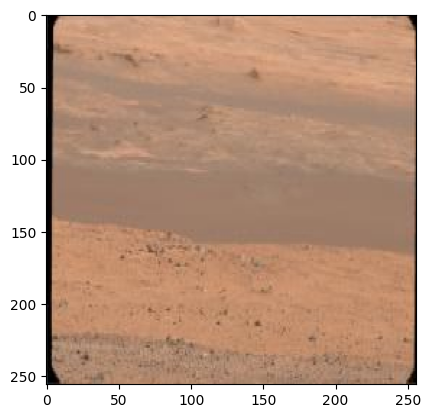

In [180]:
plt.figure()
print(len(train_ds[0][1][0]))
plt.imshow(train_ds[0][0][0])

5 indices:
- Which batch it is (batch size = 120, so 32 batches)
- Which column it is (0 - image, 1 - label)
- x values (256)
- y values (256)
- Colours (3)

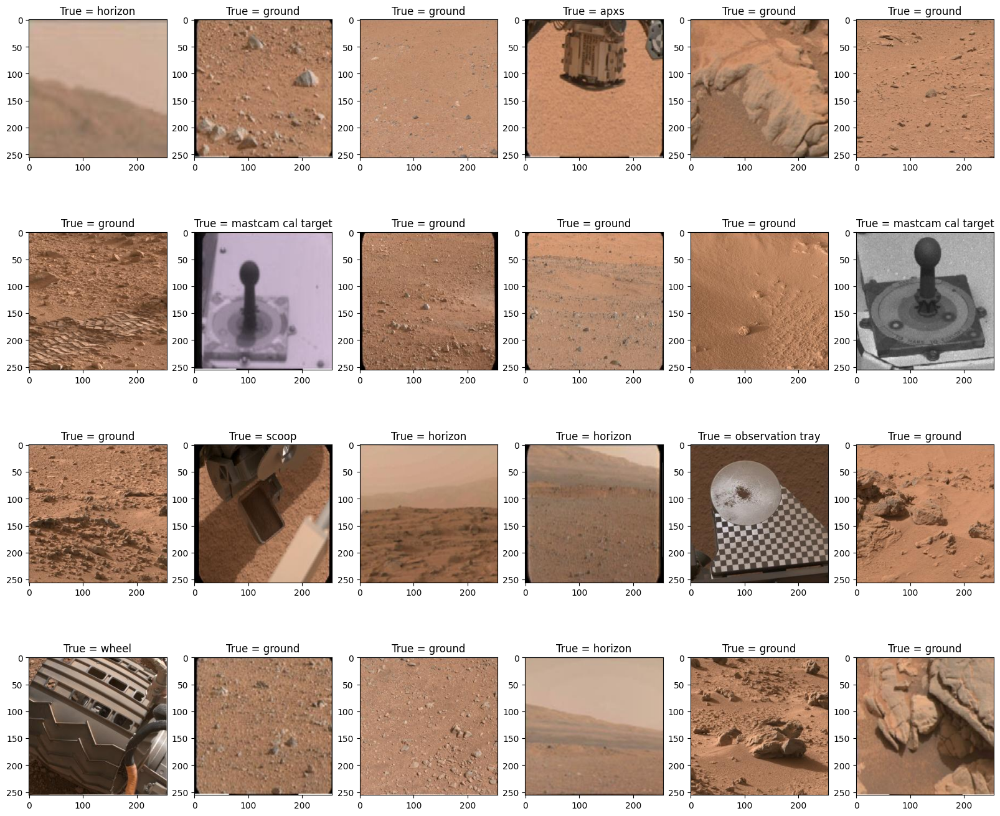

In [181]:
plt.figure(figsize = (20, 17))

j = 1
for i in train_ds:
    if j == 25:
        break
    
    true_class = np.argmax(i[1])
    plt.subplot(4, 6, j, title = "True = " + str(class_names[true_class]))
    plt.imshow(i[0][0])
    j = j + 1

## Load test data

In [182]:
class_test_locs = np.loadtxt(path_to_img + "msl-images/test-calibrated-shuffled.txt", dtype = str, delimiter = " ")
test_df = pd.DataFrame(class_test_locs, columns = ['filename','class'])
print(test_df)

test_ds = idg.flow_from_dataframe(dataframe = test_df, directory = path_to_img + "msl-images/", batch_size = batch_size, classes = class_list)

                                           filename class
0     calibrated/0830MR0036510000500684E01_DRCL.JPG     7
1     calibrated/0640MH0002640000203781I01_DRCL.JPG    24
2     calibrated/0647MH0003250050203806E01_DRCL.JPG     9
3     calibrated/0844MR0037590000501001I01_DRCL.JPG     7
4     calibrated/0618MR0026460020401253I01_DRCL.JPG    11
...                                             ...   ...
1300  calibrated/0571MH0002590000201894I01_DRCL.JPG    24
1301  calibrated/0840ML0037090000401385I01_DRCL.JPG    17
1302  calibrated/0868MH0003900000302200I01_DRCL.JPG    10
1303  calibrated/0568MH0002630000201882E01_DRCL.JPG    24
1304  calibrated/0613MH0003900000203392I01_DRCL.JPG    10

[1305 rows x 2 columns]
Found 1305 validated image filenames belonging to 25 classes.


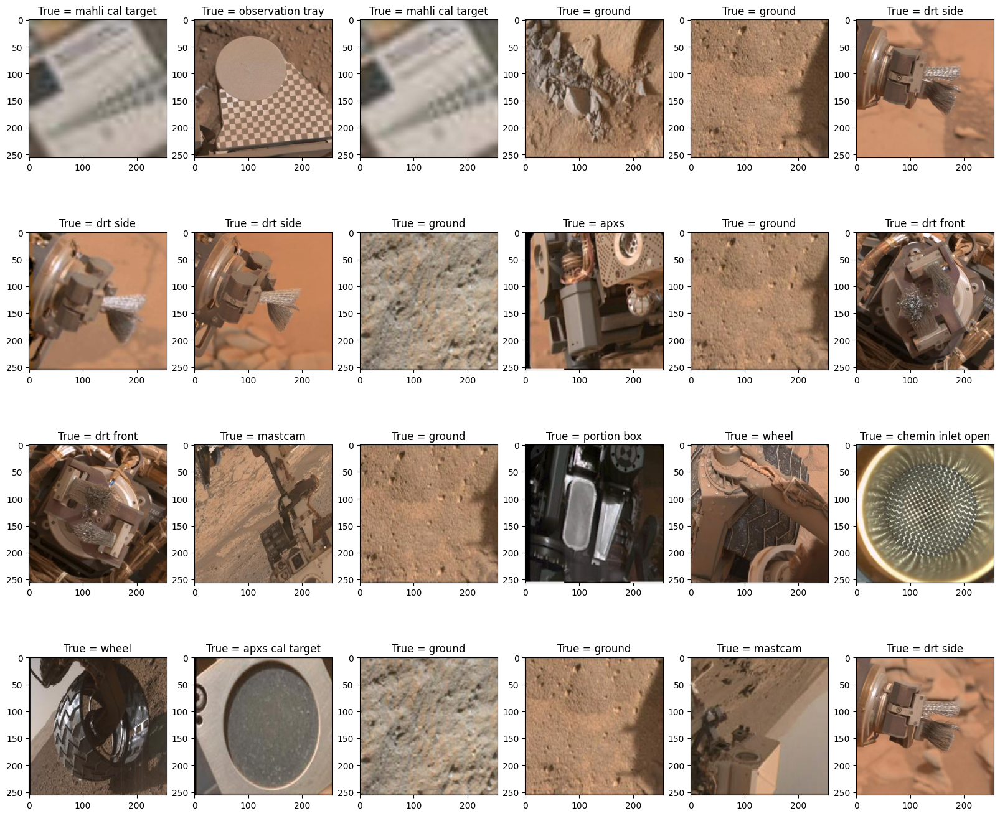

In [183]:
plt.figure(figsize = (20, 17))

j = 1
for i in test_ds:
    if j == 25:
        break
    
    true_class = np.argmax(i[1])
    plt.subplot(4, 6, j, title = "True = " + str(class_names[true_class]))
    plt.imshow(i[0][0])
    j = j + 1

## Load validation data

In [184]:
class_val_locs = np.loadtxt(path_to_img + "msl-images/val-calibrated-shuffled.txt", dtype = str, delimiter = " ")
val_df = pd.DataFrame(class_val_locs, columns = ['filename','class'])
print(val_df)

val_ds = idg.flow_from_dataframe(dataframe = val_df, directory = path_to_img + "msl-images/", batch_size = batch_size, classes = class_list)

                                           filename class
0     calibrated/0292MH0002810020103587C00_DRCL.JPG     5
1     calibrated/0270MH0002530050102760I01_DRCL.JPG     5
2     calibrated/0549MH0002620000201566E01_DRCL.JPG    24
3     calibrated/0229MR0009720000202913E01_DRCL.JPG     0
4     calibrated/0292MH0002810020103613C00_DRCL.JPG     5
...                                             ...   ...
1635  calibrated/0486MR0011580000302944E01_DRCL.JPG     0
1636  calibrated/0506MH0002240020200655I01_DRCL.JPG     8
1637  calibrated/0229MR0010840000202939I01_DRCL.JPG    16
1638  calibrated/0229MR0009760000202918I01_DRCL.JPG    18
1639  calibrated/0270MH0002530050102767E01_DRCL.JPG     5

[1640 rows x 2 columns]
Found 1640 validated image filenames belonging to 25 classes.


In [185]:
Nepochs = 20 # Change
dropout_value = 0.5 # Change

xpix = len(train_ds[0][0][0])
ypix = len(train_ds[0][0][0][0])
zpix = len(train_ds[0][0][0][0][0])

In [186]:
model = keras.models.Sequential()

model.add(keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (xpix, ypix, zpix)))
model.add(keras.layers.MaxPooling2D((2, 2)))

#model.add(keras.layers.Dropout(dropout_value)) # Added

model.add(keras.layers.Conv2D(32, (3, 3), activation = 'relu'))
model.add(keras.layers.MaxPooling2D((2, 2)))

model.add(keras.layers.Dropout(0.25)) # Added

model.add(keras.layers.Conv2D(64, (3, 3), activation = 'relu')) # Decreased nodes from 64 to 32
model.add(keras.layers.MaxPooling2D((2, 2)))

model.add(keras.layers.Dropout(0.4)) # Added

model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(128, activation = 'relu'))

model.add(keras.layers.Dropout(0.55)) # Most effective place to add a DropOut layer

# 25 classes, not 24
model.add(keras.layers.Dense(25, activation = 'softmax'))

In [187]:
print("Dropout values       = ", dropout_value)
print("Leaky relu parameter =  0.1")
print("BatchSize            = ", batch_size)
print("Nepochs              = ", Nepochs, "\n")
model.summary()

Dropout values       =  0.5
Leaky relu parameter =  0.1
BatchSize            =  120
Nepochs              =  20 

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 127, 127, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_34 (Conv2D)          (None, 125, 125, 32)      9248      
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 62, 62, 32)       0         
 g2D)                                                            
                                                                 
 dropout_33 (Dropout)        (None, 62, 62, 32)        0         
      

In [188]:
# Use CategoricalCrossentropy() instead of SparseCategoricalCrossentropy() since the data is one-hot coded
loss_fn = keras.losses.CategoricalCrossentropy()

In [189]:
model.compile(optimizer = 'adam', loss = loss_fn, metrics = ['accuracy'])

In [190]:
history = model.fit(train_ds, batch_size = batch_size, epochs = Nepochs, validation_data = val_ds)

Epoch 1/20
32/32 [==============================] - 106s 3s/step - loss: 1.9590 - accuracy: 0.5894 - val_loss: 3.1432 - val_accuracy: 0.0701
Epoch 2/20
32/32 [==============================] - 105s 3s/step - loss: 1.1868 - accuracy: 0.6789 - val_loss: 3.4841 - val_accuracy: 0.0744
Epoch 3/20
32/32 [==============================] - 122s 4s/step - loss: 0.8957 - accuracy: 0.7616 - val_loss: 2.9446 - val_accuracy: 0.1585
Epoch 4/20
32/32 [==============================] - 119s 4s/step - loss: 0.7398 - accuracy: 0.7880 - val_loss: 3.0072 - val_accuracy: 0.1683
Epoch 5/20
32/32 [==============================] - 106s 3s/step - loss: 0.6046 - accuracy: 0.8214 - val_loss: 2.6385 - val_accuracy: 0.4829
Epoch 6/20
32/32 [==============================] - 105s 3s/step - loss: 0.5373 - accuracy: 0.8348 - val_loss: 2.7363 - val_accuracy: 0.5037
Epoch 7/20
32/32 [==============================] - 105s 3s/step - loss: 0.4434 - accuracy: 0.8615 - val_loss: 2.3852 - val_accuracy: 0.5463
Epoch 8/20
32

history keys =  dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

Display the evolution of the accuracy as a function of the training epoch
  N(Epochs)        =  20
  accuracy (train) =  [0.589428722858429, 0.6788574457168579, 0.7616124153137207, 0.7880405783653259, 0.8214095234870911, 0.8347570896148682, 0.8614522218704224, 0.8694607615470886, 0.8742659091949463, 0.8889482021331787, 0.8961558938026428, 0.904698371887207, 0.8998932242393494, 0.8873465061187744, 0.9087026119232178, 0.9124399423599243, 0.9180459380149841, 0.9113721251487732, 0.916711151599884, 0.9276561737060547]
  accuracy (test)  =  [0.07012195140123367, 0.07439024746417999, 0.15853658318519592, 0.16829268634319305, 0.4829268157482147, 0.5036585330963135, 0.5463414788246155, 0.5682926774024963, 0.6000000238418579, 0.6097561120986938, 0.5762194991111755, 0.5969512462615967, 0.5890243649482727, 0.5932926535606384, 0.6030488014221191, 0.5890243649482727, 0.5945122241973877, 0.5670731663703918, 0.622560977935791

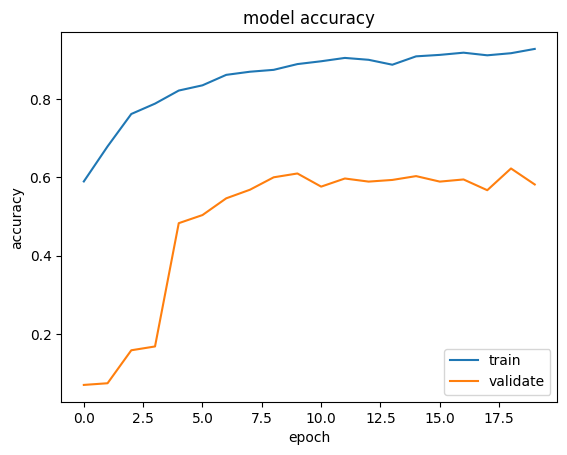


Display the evolution of the loss as a function of the training epoch
  N(Epochs)        =  20
  loss (train)     =  [1.9589605331420898, 1.1867741346359253, 0.8956780433654785, 0.7397786378860474, 0.6046497225761414, 0.5372589230537415, 0.44342607259750366, 0.41128653287887573, 0.3760450780391693, 0.34053730964660645, 0.30328136682510376, 0.3028188645839691, 0.2991245985031128, 0.33900606632232666, 0.27681609988212585, 0.25564080476760864, 0.23419445753097534, 0.25035741925239563, 0.23473532497882843, 0.22655808925628662]
  loss (test)      =  [3.143178701400757, 3.484128475189209, 2.9446160793304443, 3.0072426795959473, 2.6385486125946045, 2.7363388538360596, 2.3851616382598877, 2.188204050064087, 2.582519769668579, 2.3786814212799072, 3.090341329574585, 3.3978111743927, 2.1360318660736084, 3.0333704948425293, 3.4688076972961426, 3.787870407104492, 4.011266708374023, 4.4776411056518555, 3.4487545490264893, 5.192766189575195]


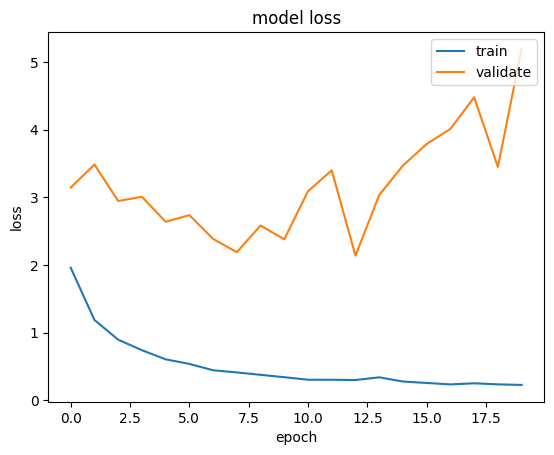


Performance summary (on test data):
11/11 - 6s - loss: 4.1994 - accuracy: 0.4805 - 6s/epoch - 561ms/step
	loss = 4.199
	accuracy = 0.480


In [191]:
print("history keys = ", history.history.keys())

print("\n\033[1mDisplay the evolution of the accuracy as a function of the training epoch\033[0m")
print("  N(Epochs)        = ", Nepochs)

print("  accuracy (train) = ", history.history['accuracy'])
print("  accuracy (test)  = ", history.history['val_accuracy'])
plt.plot(history.history['accuracy']) # 'accuracy'
plt.plot(history.history['val_accuracy']) # 'val_accuracy'
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validate'], loc = 'lower right')
plt.show()
plt.clf()

print("\n\033[1mDisplay the evolution of the loss as a function of the training epoch\033[0m")
print("  N(Epochs)        = ", Nepochs)
print("  loss (train)     = ", history.history['loss'])
print("  loss (test)      = ", history.history['val_loss'])

plt.plot(history.history['loss']) # 'loss'
plt.plot(history.history['val_loss']) # 'val_loss'
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validate'], loc = 'upper right')
plt.show()

print("\n\033[1mPerformance summary (on test data):\033[0m")
loss, acc = model.evaluate(test_ds, verbose = 2) # remember to use test set!
print("\tloss = {:5.3f}\n\taccuracy = {:5.3f}".format(loss, acc))

In [192]:
test_true_labels = []
test_ds_list = []

for i in range(len(test_ds)):
    test_true_labels.append((test_ds[i][1]))
    test_ds_list.append((test_ds[i][0]))
    
test_true_labels = np.concatenate(test_true_labels)

test_ds_list = np.concatenate(test_ds_list)
print(len(test_true_labels))

1305


In [194]:
predict_ds = model.predict(test_ds)

11/11 [==============================] - 6s 516ms/step


In [195]:
classes_dict = {'apxs': [0,0],
                'apxs cal target': [0,0],
                'chemcam cal target': [0,0],
                'chemin inlet open': [0,0],
                'drill': [0,0],
                'drill holes': [0,0],
                'drt front': [0,0],
                'drt side': [0,0],
                'ground': [0,0],
                'horizon': [0,0],
                'inlet': [0,0],
                'mahli': [0,0],
                'mahli cal target': [0,0],
                'mastcam': [0,0],
                'mastcam cal target': [0,0],
                'observation tray': [0,0],
                'portion box': [0,0],
                'portion tube': [0,0],
                'portion tube opening': [0,0],
                'rems uv sensor': [0,0],
                'rover rear deck': [0,0],
                'scoop': [0,0],
                'sun': [0,0],
                'turret': [0,0],
                'wheel': [0,0]
               }

correct_pred = []
incorrect_pred = []

j = 0
for i in range(len(predict_ds)):
    pred, true = np.argmax(predict_ds[i]), np.argmax(test_true_labels[i])
    
    if pred == true:
        #print("Match: ", np.argmax(test_true_labels[i]), np.argmax(predict_ds[i]))
        correct_pred.append(pred)
        classes_dict.update({ class_names[true] : [classes_dict[str(class_names[true])][0] + 1, classes_dict[str(class_names[true])][1]] })
        #print(np.argmax(predict_ds[i]), np.argmax(test_true_labels[i]))
        #plt.imshow(test_ds[i])
    
    else:
        #print("Not a match: ", np.argmax(test_true_labels[i]), np.argmax(predict_ds[i]))
        incorrect_pred.append(np.argmax(predict_ds[i]))
        classes_dict.update({ class_names[true] : [classes_dict[str(class_names[true])][0], classes_dict[str(class_names[true])][1] + 1] })
    
    #if i == np.argmax(predict_ds[i]):
        #plt.imshow(test_ds[i])
        #print(np.argmax(predict_ds[i]))
    #print(i, j)  
    j = j + 1

In [196]:
print(classes_dict)

{'apxs': [25, 9], 'apxs cal target': [0, 14], 'chemcam cal target': [0, 21], 'chemin inlet open': [0, 84], 'drill': [2, 18], 'drill holes': [0, 0], 'drt front': [0, 60], 'drt side': [0, 150], 'ground': [246, 8], 'horizon': [18, 54], 'inlet': [0, 16], 'mahli': [3, 9], 'mahli cal target': [22, 35], 'mastcam': [22, 10], 'mastcam cal target': [34, 14], 'observation tray': [10, 2], 'portion box': [4, 44], 'portion tube': [6, 3], 'portion tube opening': [0, 2], 'rems uv sensor': [0, 36], 'rover rear deck': [12, 2], 'scoop': [6, 4], 'sun': [0, 0], 'turret': [0, 0], 'wheel': [217, 83]}


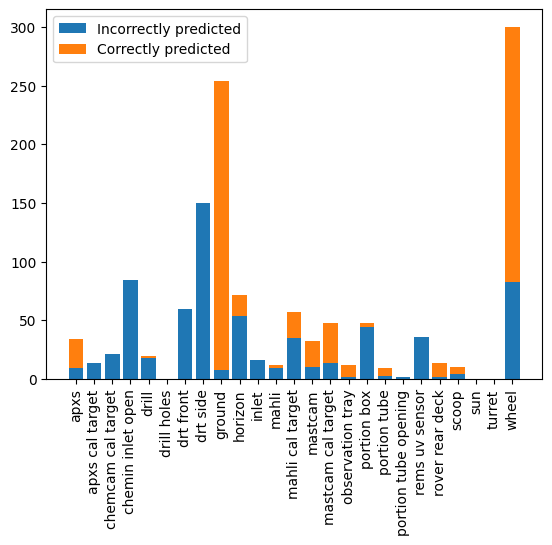

In [197]:
tick_values = np.arange(25)

correct_preds = [i[0] for i in classes_dict.values()]
incorrect_preds = [i[1] for i in classes_dict.values()]

plt.bar(tick_values, incorrect_preds, label = 'Incorrectly predicted')
plt.bar(tick_values, correct_preds, bottom = incorrect_preds, label = 'Correctly predicted')
plt.xticks(ticks = tick_values, labels = class_names, rotation = 'vertical')
plt.legend()

In [198]:
class_accuracies = []

for label in classes_dict:
    try:
        class_accuracies.append(round(100 * classes_dict[label][0] / (classes_dict[label][0] + classes_dict[label][1]), 3))
    except:
        class_accuracies.append(0)

In [199]:
print(class_accuracies)

[73.529, 0.0, 0.0, 0.0, 10.0, 0, 0.0, 0.0, 96.85, 25.0, 0.0, 25.0, 38.596, 68.75, 70.833, 83.333, 8.333, 66.667, 0.0, 0.0, 85.714, 60.0, 0, 0, 72.333]


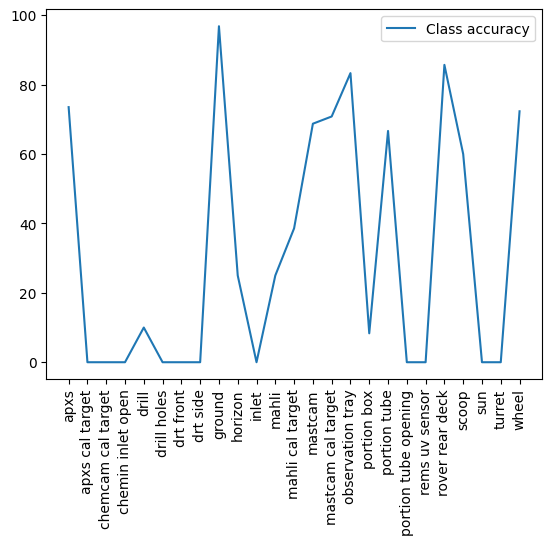

In [200]:
plt.plot(tick_values, class_accuracies, label = 'Class accuracy')
plt.xticks(ticks = tick_values, labels = class_names, rotation = 'vertical')
plt.legend()

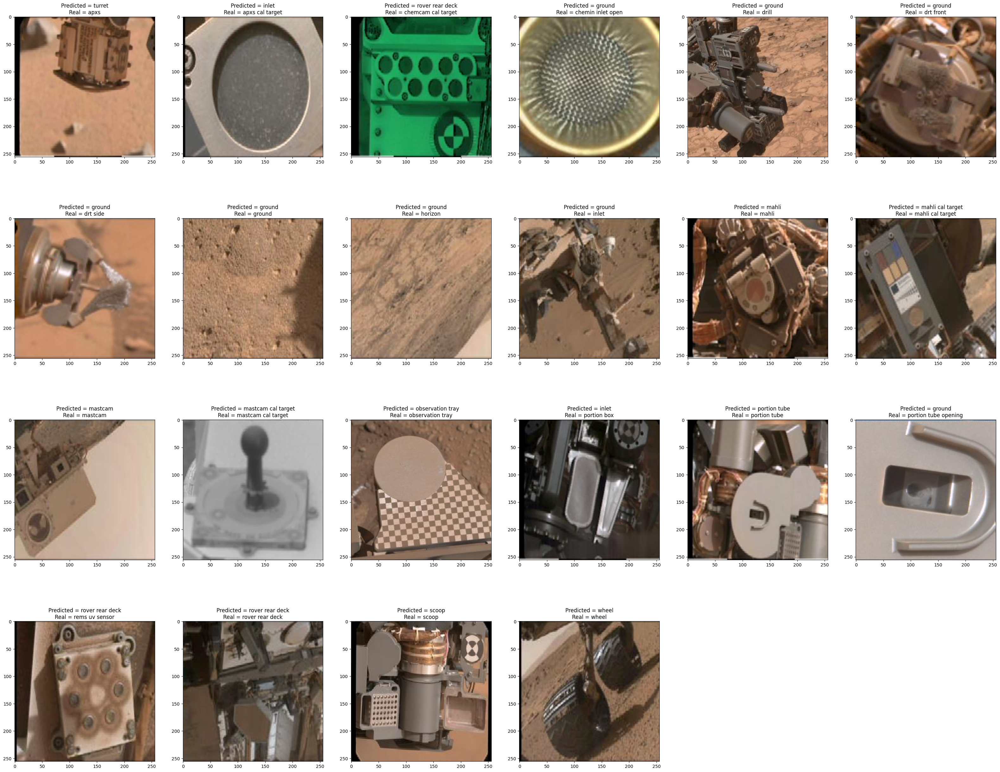

In [201]:
plt.figure(figsize = (40, 40))

j = 1
for i in range(25):
    for image in range(len(test_true_labels)):
        if np.argmax(test_true_labels[image]) == i:
            pred_class, true_class = class_names[np.argmax(predict_ds[image])], class_names[i]
            
            plt.subplot(5, 6, j, title = "Predicted = " + str(pred_class) + "\nReal = " + true_class)
            plt.imshow(test_ds_list[image])

            j = j + 1
            break
        else:
            continue

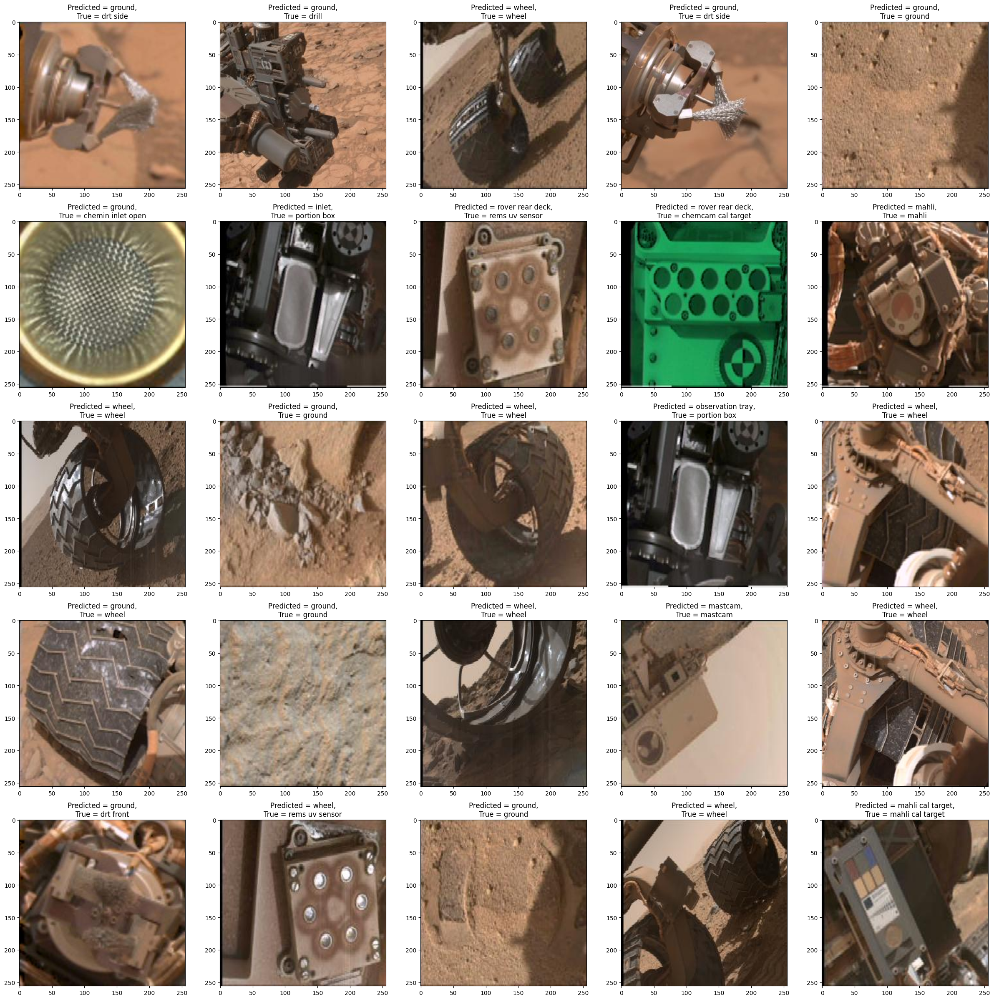

In [202]:
plt.figure(figsize = (30, 30))

j = 1
for i, image in enumerate(test_ds_list):
    if j == 26:
        break
        
    pred_class, true_class = class_names[np.argmax(predict_ds[i])] , class_names[np.argmax(test_true_labels[i])]
        
    #pred_class, true_class = np.argmax(predict_ds[i]), np.argmax(test_true_labels[i])
    #print(pred_class, true_class, "Predicted = " + str(class_names[pred_class]), "True = " + str(class_names[true_class]))
     
    plt.subplot(5, 5, j, title = "Predicted = " + pred_class + ",\nTrue = " + true_class)
    plt.imshow(image)
    j = j + 1

Not in test: 5, 22, 23

Not part of rover: 5, 8, 9, 22

----

In [204]:
rover_classes = ['0', '1']
labels = ['no_rover', 'rover']

no_rover = [5, 8, 9, 22]

image_classes = np.loadtxt(path_to_img + "msl-images/msl_synset_words-indexed.txt", dtype = str, delimiter = ",")
classes_df = pd.DataFrame(image_classes, columns = ['filename','class'])

for i, line in classes_df.iterrows():
    if int(line['filename']) in no_rover:
        classes_df.at[i, 'filename'] = '0'
    else:
        classes_df.at[i, 'filename'] = '1'

        
class_train_locs = np.loadtxt(path_to_img + "msl-images/train-calibrated-shuffled.txt", dtype = str, delimiter = " ")
train_df = pd.DataFrame(class_train_locs, columns = ['filename','class'])

for i, line in train_df.iterrows():
    if int(line['class']) in no_rover:
        train_df.at[i, 'class'] = '0'
    else:
        train_df.at[i, 'class'] = '1'

train_ds = idg.flow_from_dataframe(dataframe = train_df, directory = path_to_img + "msl-images/", batch_size = batch_size, classes = rover_classes)

class_val_locs = np.loadtxt(path_to_img + "msl-images/val-calibrated-shuffled.txt", dtype = str, delimiter = " ")
val_df = pd.DataFrame(class_val_locs, columns = ['filename','class'])

for i, line in val_df.iterrows():
    if int(line['class']) in no_rover:
        val_df.at[i, 'class'] = '0'
    else:
        val_df.at[i, 'class'] = '1'

val_ds = idg.flow_from_dataframe(dataframe = val_df, directory = path_to_img + "msl-images/", batch_size = batch_size, classes = rover_classes)

class_val_locs = np.loadtxt(path_to_img + "msl-images/val-calibrated-shuffled.txt", dtype = str, delimiter = " ")
val_df = pd.DataFrame(class_val_locs, columns = ['filename','class'])

for i, line in test_df.iterrows():
    if int(line['class']) in no_rover:
        test_df.at[i, 'class'] = '0'
    else:
        test_df.at[i, 'class'] = '1'

test_ds = idg.flow_from_dataframe(dataframe = test_df, directory = path_to_img + "msl-images/", batch_size = batch_size, classes = rover_classes)


Found 3746 validated image filenames belonging to 2 classes.
Found 1640 validated image filenames belonging to 2 classes.
Found 1305 validated image filenames belonging to 2 classes.


In [212]:
Nepochs = 20 # Change
dropout_value = 0.5 # Change

xpix = len(train_ds[0][0][0])
ypix = len(train_ds[0][0][0][0])
zpix = len(train_ds[0][0][0][0][0])

model_binary = keras.models.Sequential()

model_binary.add(keras.layers.Conv2D(16, (3, 3), activation = 'relu', input_shape = (xpix, ypix, zpix)))
model_binary.add(keras.layers.MaxPooling2D((2, 2)))

#model.add(keras.layers.Dropout(dropout_value)) # Added

model_binary.add(keras.layers.Conv2D(32, (3, 3), activation = 'relu'))
model_binary.add(keras.layers.MaxPooling2D((2, 2)))

model_binary.add(keras.layers.Dropout(dropout_value)) # Added

model_binary.add(keras.layers.Conv2D(32, (3, 3), activation = 'relu')) # Decreased nodes from 64 to 32
model_binary.add(keras.layers.MaxPooling2D((2, 2)))

model_binary.add(keras.layers.Dropout(dropout_value)) # Added

model_binary.add(keras.layers.Flatten())
model_binary.add(keras.layers.Dense(128, activation = 'relu'))

model_binary.add(keras.layers.Dropout(dropout_value)) # Most effective place to add a DropOut layer

model_binary.add(keras.layers.Dense(2, activation = 'sigmoid'))

In [213]:
print("Dropout values       = ", dropout_value)
print("Leaky relu parameter =  0.1")
print("BatchSize            = ", batch_size)
print("Nepochs              = ", Nepochs, "\n")
model_binary.summary()

Dropout values       =  0.5
Leaky relu parameter =  0.1
BatchSize            =  120
Nepochs              =  20 

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_39 (Conv2D)          (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_39 (MaxPoolin  (None, 127, 127, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_40 (Conv2D)          (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_40 (MaxPoolin  (None, 62, 62, 32)       0         
 g2D)                                                            
                                                                 
 dropout_39 (Dropout)        (None, 62, 62, 32)        0         
      

In [214]:
loss_fn_binary = keras.losses.BinaryCrossentropy()

In [215]:
model_binary.compile(optimizer = 'adam', loss = loss_fn_binary, metrics = ['accuracy', tf.keras.metrics.FalsePositives(), tf.keras.metrics.FalseNegatives(), tf.keras.metrics.TruePositives(), tf.keras.metrics.TrueNegatives()])

In [216]:
history_binary = model_binary.fit(train_ds, batch_size = batch_size, epochs = Nepochs, validation_data = val_ds)

Epoch 1/20
32/32 [==============================] - 69s 2s/step - loss: 0.7279 - accuracy: 0.6762 - false_positives_5: 1428.0000 - false_negatives_5: 1116.0000 - true_positives_5: 2630.0000 - true_negatives_5: 2318.0000 - val_loss: 0.6837 - val_accuracy: 0.3854 - val_false_positives_5: 1007.0000 - val_false_negatives_5: 1008.0000 - val_true_positives_5: 632.0000 - val_true_negatives_5: 633.0000
Epoch 2/20
32/32 [==============================] - 70s 2s/step - loss: 0.4126 - accuracy: 0.8105 - false_positives_5: 647.0000 - false_negatives_5: 852.0000 - true_positives_5: 2894.0000 - true_negatives_5: 3099.0000 - val_loss: 0.4829 - val_accuracy: 0.8037 - val_false_positives_5: 321.0000 - val_false_negatives_5: 323.0000 - val_true_positives_5: 1317.0000 - val_true_negatives_5: 1319.0000
Epoch 3/20
32/32 [==============================] - 68s 2s/step - loss: 0.2674 - accuracy: 0.9074 - false_positives_5: 240.0000 - false_negatives_5: 580.0000 - true_positives_5: 3166.0000 - true_negatives_5

history keys =  dict_keys(['loss', 'accuracy', 'false_positives_5', 'false_negatives_5', 'true_positives_5', 'true_negatives_5', 'val_loss', 'val_accuracy', 'val_false_positives_5', 'val_false_negatives_5', 'val_true_positives_5', 'val_true_negatives_5'])

Display the evolution of the accuracy as a function of the training epoch
  N(Epochs)        =  20
  accuracy (train) =  [0.6761879324913025, 0.8104645013809204, 0.9073678851127625, 0.9073678851127625, 0.9135077595710754, 0.9273892045021057, 0.9369994401931763, 0.9297917485237122, 0.9394020438194275, 0.9418045878410339, 0.9343299269676208, 0.9447410702705383, 0.9468766450881958, 0.9380672574043274, 0.9394020438194275, 0.9439402222633362, 0.9439402222633362, 0.9575546979904175, 0.9503470659255981, 0.9580886363983154]
  accuracy (test)  =  [0.3853658437728882, 0.8036585450172424, 0.8036585450172424, 0.75, 0.7835366129875183, 0.872560977935791, 0.9121951460838318, 0.9256097674369812, 0.9207317233085632, 0.9341463446617126, 0.91585367918

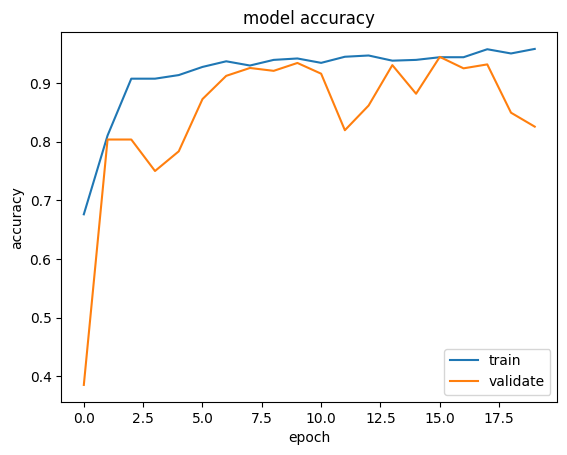


Display the evolution of the loss as a function of the training epoch
  N(Epochs)        =  20
  loss (train)     =  [0.7278539538383484, 0.4126483201980591, 0.2674410343170166, 0.2254161834716797, 0.1926066130399704, 0.16459020972251892, 0.15763670206069946, 0.15420301258563995, 0.14198637008666992, 0.12735237181186676, 0.1277589350938797, 0.11151115596294403, 0.10272367298603058, 0.13821348547935486, 0.12348272651433945, 0.11754623800516129, 0.11049099266529083, 0.09101899713277817, 0.09073822945356369, 0.08160524070262909]
  loss (test)      =  [0.6837114095687866, 0.48287948966026306, 0.38442426919937134, 0.3083116412162781, 0.28732576966285706, 0.2682470381259918, 0.2825930416584015, 0.2969740331172943, 0.2573012113571167, 0.25706958770751953, 0.26374298334121704, 0.3143123388290405, 0.27700716257095337, 0.25243741273880005, 0.26315492391586304, 0.23034818470478058, 0.27908843755722046, 0.29439452290534973, 0.30561962723731995, 0.3016374707221985]


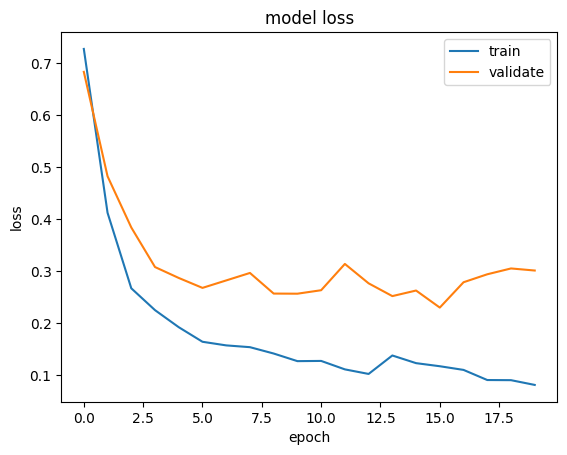


Performance summary (on test data):
11/11 - 6s - loss: 0.5184 - accuracy: 0.7716 - false_positives_5: 298.0000 - false_negatives_5: 298.0000 - true_positives_5: 1007.0000 - true_negatives_5: 1007.0000 - 6s/epoch - 527ms/step
	loss = 0.518
	accuracy = 0.772


In [219]:
print("history keys = ", history_binary.history.keys())

print("\n\033[1mDisplay the evolution of the accuracy as a function of the training epoch\033[0m")
print("  N(Epochs)        = ", Nepochs)

print("  accuracy (train) = ", history_binary.history['accuracy'])
print("  accuracy (test)  = ", history_binary.history['val_accuracy'])
plt.plot(history_binary.history['accuracy']) # 'accuracy'
plt.plot(history_binary.history['val_accuracy']) # 'val_accuracy'
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validate'], loc = 'lower right')
plt.show()
plt.clf()

print("\n\033[1mDisplay the evolution of the loss as a function of the training epoch\033[0m")
print("  N(Epochs)        = ", Nepochs)
print("  loss (train)     = ", history_binary.history['loss'])
print("  loss (test)      = ", history_binary.history['val_loss'])

plt.plot(history_binary.history['loss']) # 'loss'
plt.plot(history_binary.history['val_loss']) # 'val_loss'
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validate'], loc = 'upper right')
plt.show()

print("\n\033[1mPerformance summary (on test data):\033[0m")
loss_binary, acc_binary, fp, fn, tp, tn = model_binary.evaluate(test_ds, verbose = 2) # remember to use test set!
print("\tloss = {:5.3f}\n\taccuracy = {:5.3f}".format(loss_binary, acc_binary))

Text(0.5, 1.0, 'ROC curve')

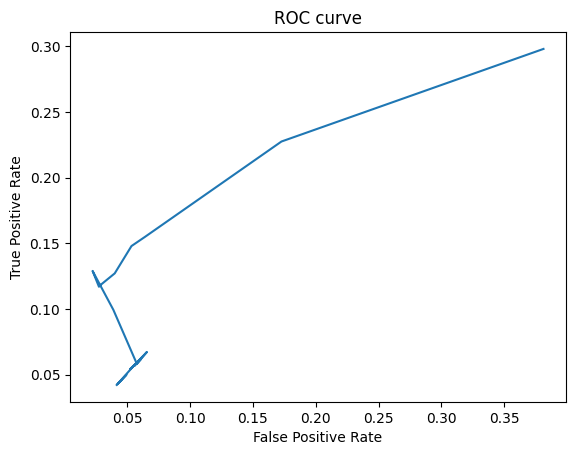

In [229]:
fp_list = history_binary.history['false_positives_5']
fn_list = history_binary.history['false_negatives_5']
tp_list = history_binary.history['true_positives_5']
tn_list = history_binary.history['true_negatives_5']

fp_rate, tp_rate = [], []

for i in range(len(fp_list)):
    fp_temp = fp_list[i] / (fp_list[i] + tn_list[i])
    fp_rate.append(fp_temp)
    
    tp_temp = 1 - (tp_list[i] / (tp_list[i] + fn_list[i]))
    tp_rate.append(tp_temp)
    
plt.plot(fp_rate, tp_rate)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')